In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
from ete3 import Tree
import random, os, time
from ete3 import NCBITaxa
import seaborn as sns
import unicodedata
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import operator

In [2]:
%config Completer.use_jedi = False

In [3]:
data=pd.read_excel('../Plastic database_Final_Ankita.xlsx')

In [4]:
data.head()

,,doi,Microorganism,Microorganism_abb,taxa_no,Plastic,Plastic_abb.,Plastic treatment/types,Comment,Evidence,Sequence,GenbankID,Year,journal,Unnamed: 14,Unnamed: 15
0,Biodegradation of aliphatic-aromatic copolyest...,10.1128/AEM.64.5.1731-1735.1998,Thermobifida fusca,Thermobifida fusca,NaN,BTA copolyester,BTA copolyester,polymer films were irradiated under a UV lamp,NaN,['Weight loss'],[nan],[nan],[1998.0],Appl Environ Microbiol,NaN,NaN
1,"A novel Ca²⁺-activated, thermostabilized polye...",10.1007/s00253-014-5860-y,Saccharomonospora viridis,Saccharomonospora viridis,NaN,"Ecoflex (Terephthalic acid + 1,4-butandiol+adi...",PBAT,-,"PBSA>PBS, PCL>Ecoflex®> PHB, PDLA>PLLA.",['Clear zone'],['MRIRRQAGTGARASMARAIGVMTTALAVLVGAVGGVAGAEVSTA...,['BAO42836.1'],[2014.0],Appl Microbiol Biotechnol,NaN,NaN
2,<span>Biodegradation of thermally treated high...,10.1007/s13205-017-0959-3,Klebsiella pneumoniae,Klebsiella pneumoniae,NaN,HDPE,HDPE,Pretreated,treated thermally in a preheated hot air oven ...,['Clear zone;Weight loss;UTM;SEM;AFM;FTIR;MS'],[nan],[nan],[2017.0],3 Biotech,NaN,NaN
3,High-density polyethylene (HDPE)-degrading pot...,10.1111/j.1472-765X.2010.02883.x,Pseudomonas sp.,Pseudomonas sp.,NaN,HDPE,HDPE,-,-,['Weight loss;FTIR'],[nan],[nan],[2010.0],Lett Appl Microbiol,NaN,NaN
4,High-density polyethylene (HDPE)-degrading pot...,10.1111/j.1472-765X.2010.02883.x,Arthrobacter sp.,Arthrobacter sp.,NaN,HDPE,HDPE,-,-,['Weight loss;FTIR'],[nan],[nan],[2010.0],Lett Appl Microbiol,NaN,NaN


In [5]:
data.shape

(1687, 16)

In [6]:
df=pd.DataFrame(data)

In [7]:
df_org=df[['doi','Microorganism_abb','Plastic_abb.']].drop_duplicates()

In [8]:
ncbi = NCBITaxa()

In [9]:
#micro=[]
count=0
for index,row in df_org.iterrows():
    if len(ncbi.get_name_translator([row['Microorganism_abb']]).items())==0:
        print([index,row['Microorganism_abb']])
        count+=1  

[1423, '-']
[1424, '-']
[1425, '-']
[1426, '-']
[1427, '-']
[1428, '-']
[1553, '-']
[1554, '-']
[1564, '-']
[1565, '-']
[1577, '-']
[1578, '-']
[1587, '-']
[1588, '-']
[1589, '-']
[1590, '-']
[1636, '-']
[1637, '-']
[1639, '-']
[1640, '-']
[1641, '-']
[1642, '-']
[1645, '-']
[1646, '-']
[1656, '-']
[1657, '-']
[1658, '-']
[1659, '-']
[1665, '-']
[1666, '-']
[1667, '-']
[1668, '-']
[1669, '-']


In [10]:
count

33

In [11]:
count=0
for i in df_org.groupby(['doi']):
     if '-' in i[1]['Microorganism_abb'].values:
            print(i[0])
            #print(i[1]['Microorganism_abb'].values)
            count+=1

10.1007/s00253-008-1477-3
10.1016/j.ibiod.2015.03.015
10.1016/j.ibiod.2016.03.016
10.1021/acs.est.8b02301
10.1021/acs.est.8b04252
10.1371/journal.pone.0183984
10.1590/S1516-89132013000300016
10.3389/fbioe.2021.684459
10.3390/polym13060860
http://ijaseat.iraj.in/paper_detail.php?paper_id=13431&name=Biodegradation_of_Polyethylene_Terephthalate_(PET_or_PETE)_and_High_Density_Polyethylene_(HDPE)_Using_Microbes_Isolated_from_Waste_Dumping_Sites_in_Chittagong,_Bangladesh
http://www.journalcra.com/sites/default/files/issue-pdf/16398_0.pdf


In [12]:
count

11

In [13]:
micro={}
count=0
for index,row in df_org.iterrows():
    if len(ncbi.get_name_translator([row['Microorganism_abb']]).items())==1:
        micro.update({list(ncbi.get_name_translator([row['Microorganism_abb']]).items())[0][0]:list(ncbi.get_name_translator([row['Microorganism_abb']]).items())[0][1][0]})
        count+=1  

In [14]:
count

1494

### Add taxa ids to dataframe

In [15]:
taxa=[]
for index,row in df_org.iterrows():
    try:
        taxa.append(micro[row['Microorganism_abb']])
    except:
        taxa.append(row['Microorganism_abb'])

In [16]:
df_org['taxa']=taxa

In [17]:
count

1494

In [18]:
df_org.head()

,doi,Microorganism_abb,Plastic_abb.,taxa
0,10.1128/AEM.64.5.1731-1735.1998,Thermobifida fusca,BTA copolyester,2021
1,10.1007/s00253-014-5860-y,Saccharomonospora viridis,PBAT,1852
2,10.1007/s13205-017-0959-3,Klebsiella pneumoniae,HDPE,573
3,10.1111/j.1472-765X.2010.02883.x,Pseudomonas sp.,HDPE,306
4,10.1111/j.1472-765X.2010.02883.x,Arthrobacter sp.,HDPE,1667


In [19]:
count=[]
for taxa in df_org['taxa']:
    #print(taxa)
    genus=[]
    try:
        for key,value in ncbi.get_rank(ncbi.get_lineage(taxa)).items():
            if value=='genus':
                genus.append(key)
    except:
        print(taxa)
    genus.append(taxa)
    count.append(genus)

-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-


### removes rows with no '-' microorganism value

In [20]:
df_org=df_org.loc[~(df_org['taxa']=='-')]

In [21]:
len(set([i[0] for i in count]))

224

# genus level clustering 

In [22]:
df_org.loc[~(df['Microorganism_abb']=='Uncultured bacterium')].shape

(1480, 4)

In [23]:
df_org=df_org.loc[~(df['Microorganism_abb']=='Uncultured bacterium')]

In [24]:
df_org.loc[~(df['Microorganism_abb']=='uncultured fungus')].shape

(1478, 4)

In [25]:
df_org=df_org.loc[~(df['Microorganism_abb']=='uncultured fungus')]

In [26]:
df_org.loc[~(df['Microorganism_abb']=='Gut Microbiome')].shape

(1477, 4)

In [27]:
df_org=df_org.loc[~(df['Microorganism_abb']=='Gut Microbiome')]

In [28]:
df_org.shape

(1477, 4)

### recheck the taxa ids with zero NA genus entry

In [29]:
count=[]
for taxa in df_org['taxa']:
    #print(taxa)
    genus=[]
    for key,value in ncbi.get_rank(ncbi.get_lineage(taxa)).items():
        if value=='genus':
            genus.append(key)
    genus.append(taxa)
    count.append(genus)

In [30]:
[i for i in count if len(i)==1]

[[413882], [413882], [86188]]

In [31]:
genus=[]
for i in count:
    if len(i)==2:
        genus.append(i[0])
    else:
        genus.append(0)

In [32]:
df_org['genus']=genus

In [33]:
df_org.loc[df_org['taxa']==86188]

,doi,Microorganism_abb,Plastic_abb.,taxa,genus
825,10.1016/j.polymdegradstab.2018.03.023,Pseudomonas geniculata,PLA,86188,0


In [34]:
df_org['genus'][825]=40323

/home/sunny/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


### drop all rows have  zero genus entry

In [35]:
df_org=df_org.loc[~(df_org['genus']==0)]

In [36]:
df_org.shape

(1475, 5)

In [37]:
len(df_org.genus.unique())

218

In [38]:
len(df_org['Plastic_abb.'].unique())

80

In [39]:
import collections

In [40]:
count=[]
for i in df_org.groupby('genus'):
    count.append(len(set(i[1]['Plastic_abb.'])))

In [41]:
len([i for i in count if i >1])

118

In [42]:
collections.Counter(count)

Counter({3: 20,
         5: 8,
         4: 15,
         2: 36,
         1: 100,
         6: 9,
         8: 6,
         37: 1,
         9: 6,
         7: 6,
         27: 1,
         12: 2,
         13: 1,
         22: 2,
         16: 1,
         18: 1,
         10: 3})

In [43]:
import matplotlib.pyplot as plt

In [44]:
collections.Counter(count).items()

dict_items([(3, 20), (5, 8), (4, 15), (2, 36), (1, 100), (6, 9), (8, 6), (37, 1), (9, 6), (7, 6), (27, 1), (12, 2), (13, 1), (22, 2), (16, 1), (18, 1), (10, 3)])

### sorting a dictionary

In [45]:
sorted(collections.Counter(count).items(), key=lambda x:x[1])

[(37, 1),
 (27, 1),
 (13, 1),
 (16, 1),
 (18, 1),
 (12, 2),
 (22, 2),
 (10, 3),
 (8, 6),
 (9, 6),
 (7, 6),
 (5, 8),
 (6, 9),
 (4, 15),
 (3, 20),
 (2, 36),
 (1, 100)]

In [46]:
val=[j for i,j in sorted(collections.Counter(count).items())]
ind=[i for i,j in sorted(collections.Counter(count).items())]

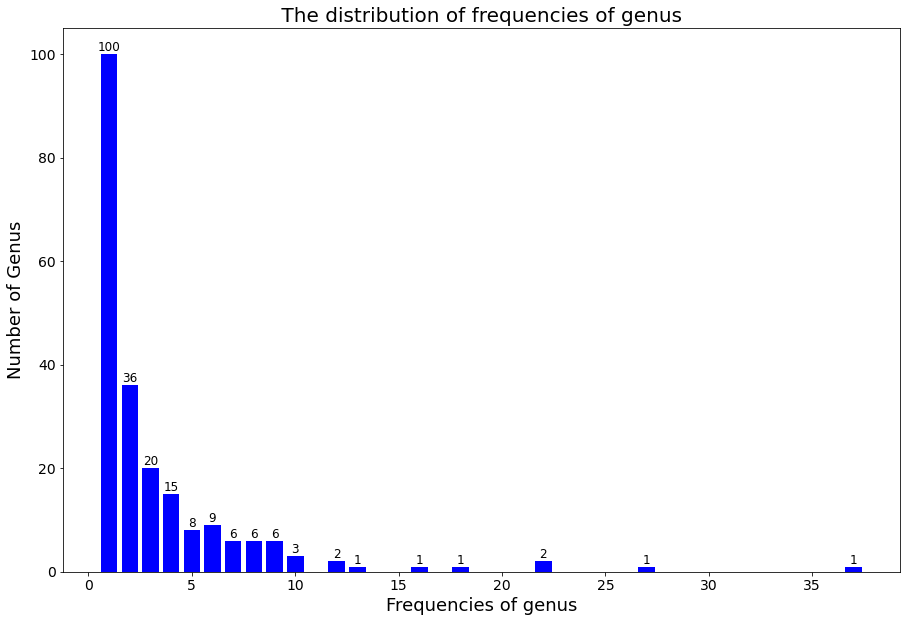

In [55]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.bar(ind,val)
ax.set_title(' The distribution of frequencies of genus ',fontsize=20)
ax.set_ylabel('Number of Genus',fontsize=18)
ax.set_xlabel('Frequencies of genus',fontsize=18)
plt.xticks(fontsize=14,) #rotation=90)
plt.yticks(fontsize=14,)
bars=ax.bar(ind,val, color='b')
ax.bar_label(bars,fontsize=12)
#plt.show()
plt.savefig('image1.tiff')

In [56]:
ls

'genus level clustering 28 feb 2022.ipynb'   image1.jpg   image1.tiff


In [57]:
sum(val)

218

In [58]:
len([i for i in count if i >3])

62

### we have 62 genus which reported more than three plastic types 
### we will consider only popular plastic type which are reported for more than 10 genus and drop rows based on that 

In [60]:
len(df_org['Plastic_abb.'].unique())

80

In [61]:
df_org['Plastic_abb.'].unique()

array(['BTA copolyester', 'PBAT', 'HDPE', 'LDPE', 'PVC', 'PAH',
       'LDPE Blend', 'Nylon', 'PVA', 'O-PVA', 'Oxo-biodegradable PE',
       'P(3HB-co-3HP)', 'P(3HB-co-3MP)', 'PHB', 'P(3HB-co-4HB', 'PCL',
       'P(3HO)', 'P(3HB)', 'P3HP', 'PHBV', 'PEA', 'P4HB', 'PES',
       'PHBV Oligomers', 'P3HV Oligomers', 'PHB Oligomers', 'PEC', 'PBS',
       'PCL Blend', 'PBSA', 'PBS Blend', 'PLA', 'PBSA Blend', 'PET',
       'PET Blend', 'PHA', 'PHPV ', 'PU', 'PTS', 'PHC', 'LLDPE', 'PP',
       'PE', 'PS', 'PPL', 'PEF', 'PEG', 'mcl-PHA', 'PHB  Blend', 'PHO',
       'PHN', 'PHD', 'PHV', 'PHBH', 'PHPV', 'PMCL', 'PS Blend', 'PSS',
       'PU Blend', 'PVC Blend', 'PC', 'PLLA', 'Mater-Bi', 'PETG',
       'PBST55', 'PTMS', 'PVA Blend', 'PCL hp', 'PC bf', 'PTMS/A',
       'PBSTIL', 'PTSu', 'PLA Blend', 'PLA/PHB Blend', 'PTC', 'P3HV',
       'PBA', 'PBT', 'PCL-PU Blend', 'PP-PLA Blend'], dtype=object)

In [62]:
count=[]
for i in df_org.groupby('Plastic_abb.'):
    if len(set(i[1]['genus']))>10:
        count.append(i[0])

In [63]:
len(count)

20

In [64]:
count

['HDPE',
 'LDPE',
 'Nylon',
 'PBS',
 'PBSA',
 'PCL',
 'PE',
 'PES',
 'PET',
 'PHA',
 'PHB',
 'PHBH',
 'PHBV',
 'PLA',
 'PLA/PHB Blend',
 'PP',
 'PS',
 'PU',
 'PVA',
 'PVC']

## select only rows with selected plastic types

In [65]:
df_org=df_org.loc[df_org['Plastic_abb.'].isin(count)]

In [66]:
df_org=df_org.loc[~(df_org['Plastic_abb.']=='PLA/PHB Blend')]

In [67]:
df_org.shape


(1260, 5)

## occurence matrix of size # of genus by # of plastic type

In [68]:
len(df_org['genus'].unique())

207

In [69]:
genus_selected=list(df_org['genus'].unique())

In [70]:
len(df_org['Plastic_abb.'].unique())

19

In [71]:
plastic_selected=list(df_org['Plastic_abb.'].unique())

In [72]:
co_mat=np.zeros([207,19])

In [73]:
for i in df_org.groupby('genus'):
    #print(doi_selected.index(i[0]))
    for j in set(i[1]['Plastic_abb.'].values):
        co_mat[genus_selected.index(i[0])][plastic_selected.index(j)]=1

### first we will develop minimum matrix

In [74]:
cooccurence_mat=np.zeros([19,19])

In [75]:
for i in range(207):
    for j in range(19):
        if co_mat[i][j]==1:
            for k in range(j,19):
                if co_mat[i][k]==1:
                    cooccurence_mat[j][k]+=1
                    cooccurence_mat[k][j]+=1

In [76]:
for i in range(19):
    cooccurence_mat[i][i]=cooccurence_mat[i][i]/2

In [77]:
from sklearn.metrics.pairwise import cosine_similarity

In [78]:
cooccurence_mat_norm=cosine_similarity(cooccurence_mat)

In [79]:
cooccurence_mat_dist=1-cooccurence_mat_norm

In [80]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [81]:
Z=linkage(cooccurence_mat_dist)

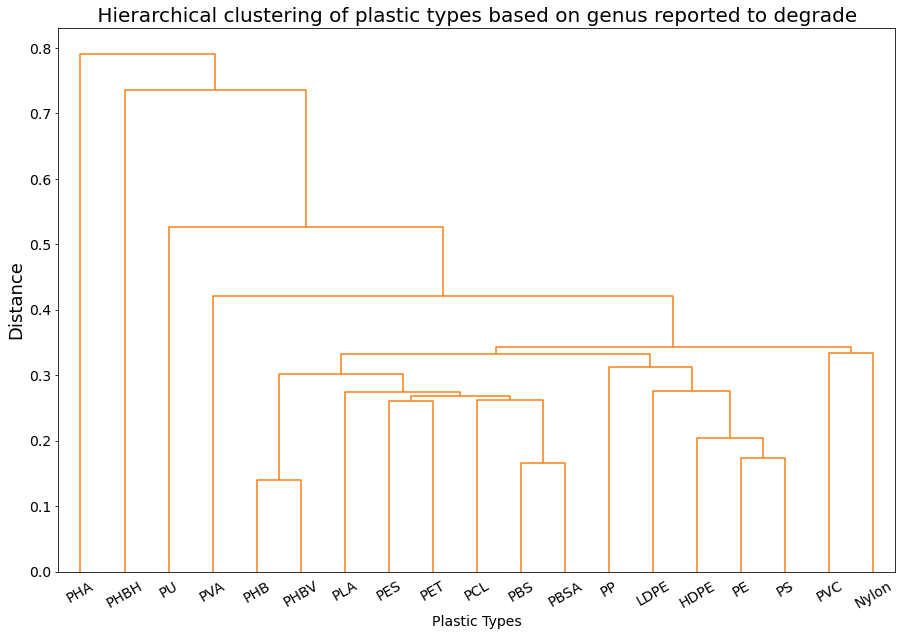

In [88]:
fig, ax = plt.subplots(figsize=(15, 10))
dendo=dendrogram(Z, orientation='top',truncate_mode=None,labels=plastic_selected,ax=ax,leaf_rotation=30,color_threshold=1)
ax.set_title(' Hierarchical clustering of plastic types based on genus reported to degrade ',fontsize=20)
ax.set_ylabel('Distance',fontsize=18)
plt.xticks(fontsize=14,) #rotation=90)
plt.yticks(fontsize=14,) #rotation=90)
ax.set_xlabel('Plastic Types',fontsize=14)
plt.savefig("genus hierarchical clustering.tiff")
plt.show()

In [87]:
ls

'genus hierarchical clustering.jpg'  'genus level clustering 28 feb 2022.ipynb'
'genus hierarchical clustering.png'  'publication images'/


In [89]:
from sklearn.manifold import MDS
from matplotlib import pyplot as plt
import sklearn.datasets as dt
import seaborn as sns         
import numpy as np
from sklearn.metrics.pairwise import manhattan_distances, euclidean_distances
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

In [90]:
mds = MDS(dissimilarity='precomputed', random_state=0)

In [91]:
X_transform_L1 = mds.fit_transform(cooccurence_mat_dist)

In [92]:
test=pd.DataFrame(X_transform_L1,columns=['Dimension-1','Dimension-2'])

In [93]:
test['plastic']=plastic_selected

In [94]:
import plotly.express as px

In [95]:
fig = px.scatter(test,x='Dimension-1',y='Dimension-2', hover_data=['plastic'],labels=test['plastic'],text=test['plastic'],)
fig.update_traces(textposition="bottom right")
fig.show()

In [96]:
plastic_class=['C-C','C-C','C-C','C-X','C-C','C-X','C-X','C-X','C-X','C-X','C-X','C-X','C-X','C-X','C-X','C-C','C-C','C-C','C-X']

In [97]:
test['plastic_class']=plastic_class

In [98]:
import plotly.graph_objects as go

In [99]:
fig = px.scatter(test,x='Dimension-1',y='Dimension-2',text=test['plastic'],color="plastic_class", symbol="plastic_class",title="Multidimensional scaling of plastic types based on genus reported to degrade")
fig.update_traces(textposition='middle right')
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))
fig.show()

In [102]:
#fig, ax = plt.subplots(figsize=(15, 10))
fig = px.scatter(test,x='Dimension-1',y='Dimension-2',text=test['plastic'],color="plastic_class", symbol="plastic_class",title="Multidimensional scaling of plastic types based on genus reported to degrade")
fig.update_traces(textposition='middle right')

fig.show()

In [148]:
sym=[]
for i in plastic_class:
    if i == 'C-C':
        sym.append('circle')
    else:
        sym.append('diamond')

In [149]:
test['symb']=sym

In [150]:
col=[]
for i in plastic_class:
    if i == 'C-C':
        col.append('red')
    else:
        col.append('blue')

In [151]:
#fig, ax = plt.subplots(figsize=(15, 10))
fig = px.scatter(test,x='Dimension-1',y='Dimension-2',text=test['plastic'],color="plastic_class",)
fig.update_traces(textposition='middle right')

fig.show()

In [115]:
test

,Dimension-1,Dimension-2,plastic,plastic_class,symb
0,0.091682,0.036867,HDPE,C-C,square
1,0.128925,0.011900,LDPE,C-C,square
2,0.045690,0.174969,PVC,C-C,square
3,0.175741,-0.055277,Nylon,C-X,diamond
4,0.263890,0.089770,PVA,C-C,square
5,0.011744,-0.141272,PHB,C-X,diamond
6,-0.102585,-0.086006,PCL,C-X,diamond
7,0.007607,-0.116618,PHBV,C-X,diamond
8,-0.048882,-0.037518,PES,C-X,diamond
9,-0.161418,-0.026646,PBS,C-X,diamond


In [154]:
fig = go.Figure(go.Scatter(mode='markers',x=test['Dimension-1'],y=test['Dimension-2'],marker_symbol=test['symb'],marker_color=col,text=test['plastic']))
fig.update_traces(textposition='middle right')
fig.show()

In [169]:
fig = px.scatter(x=test['Dimension-1'],y=test['Dimension-2'],text=test['plastic'],symbol=sym,colors= col)
fig.update_traces(textposition='middle right')
fig.show()

TypeError: scatter() got an unexpected keyword argument 'colors'

In [173]:
sym=[]
for i in plastic_class:
    if i == 'C-C':
        sym.append(1)
    else:
        sym.append(2)

In [180]:
col=[]
for i in plastic_class:
    if i == 'C-C':
        col.append('a')
    else:
        col.append('b')

In [181]:
test['symb']=sym
test['colr']=col

In [176]:
color=['red','blue']
symbols = ['circle','diamond']

In [236]:
! pip install -U kaleido

In [238]:
fig = px.scatter(test,x='Dimension-1',y='Dimension-2',symbol='symb',color='colr',text=test['plastic'],symbol_sequence=symbols,
                 color_discrete_sequence = color)
fig.update_traces(textposition='bottom center',textfont_size=14,)
#img_bytes = fig.to_image(format="jpg")
#Image(img_bytes)
#pio.write_image(fig, "microbial_mds.png")
#fig.to_image(format="png", engine="kaleido")
fig.to_image(format="png", engine="orca")

KeyboardInterrupt: 

In [191]:
from IPython.display import Image

In [233]:
img_bytes = fig.to_image(format="png", width=1200, height=700, scale=10)
Image(img_bytes)

In [239]:
fig = px.scatter(test,x='Dimension-1',y='Dimension-2',symbol='symb',color='colr',text=test['plastic'],symbol_sequence=symbols,
                 color_discrete_sequence = color)
fig.update_traces(textposition='middle right',textfont_size=18,)


In [222]:
import plotly.io as pio

In [240]:
! conda install -c conda-forge python-kaleido

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: | ^C
failed with initial frozen solve. Retrying with flexible solve.

CondaError: KeyboardInterrupt



 1/1: from rdkit import Chem
 2/1: from chembl_webresource_client.new_client import new_client
 2/2: molecule = new_client.molecule
 2/3: res = molecule.search('viagra')
 2/4: res
 2/5: res[max_phase]
 2/6: res(max_phase)
 2/7: res['max_phase']
 2/8: res('max_phase')
 2/9: res.type()
2/10:
for b in res:
    print(b)
2/11: res[0]
2/12: res[0]['withdrawn_year']
2/13: res[0]['therapeutic_flag']
2/14: res[0]['molecule_synonym']
2/15: res = molecule.search('metformin')
2/16: res[0]
2/17: m1 = molecule.get('CHEMBL25')
2/18: m1
 3/1: from chembl_webresource_client.new_client import new_client
 3/2: molecule = new_client.molecule
 3/3: m1 = molecule.get('CHEMBL25')
 3/4: m1
 3/5: m1 = molecule.get('CHEMBL1927146')
 3/6: m1
 4/1: f=open('SIGNAL P 441.txt','r')
 4/2: l=f.readlines()
 4/3: l[0]
 4/4: f1=open('Proteininfo_with_sigp_keggkog_IPR TARGET P 2.0.txt','r')
 4/5: l1=f1.readlines()
 4/6: l1[0]
 4/7: l1[1]
 4/8:
for i in l:
    first=i[:i.find('\t')].strip()
    for j in l1:
        second=

53/15: root = tkinter.Tk()
53/16: img = tk.PhotoImage(file="centrifuge.jpg")
53/17: img = tkinter.PhotoImage(file="centrifuge.jpg")
53/18: img = tkinter.PhotoImage(file="centrifuge.jpg")
53/19: img = tkinter.PhotoImage(file="centrifuge.jpg")
53/20: img = tkinter.PhotoImage(file="centrifuge.png")
53/21: show_image = ScrollableImage(root, image=img)
53/22: show_image.pack()
53/23:

root.mainloop()
54/1: import tkinter
54/2: from PIL import ImageTk, Image
54/3:
class ScrollableImage(tkinter.Canvas):
    def __init__(self, master=None, **kw):
        self.image = kw.pop('image', None)
        super(ScrollableImage, self).__init__(master=master, **kw)
        self['highlightthickness'] = 0
        self.propagate(0)  # wont let the scrollbars rule the size of Canvas
        self.create_image(0,0, anchor='nw', image=self.image)
        # Vertical and Horizontal scrollbars
        self.v_scroll = tkinter.Scrollbar(self, orient='vertical', width=6)
        self.h_scroll = tkinter.Scrollbar(self

115/62: feature_corr.shape
115/63: mask = np.zeros_like(feature_corr)
115/64:  mask[np.triu_indices_from(mask)]=True
115/65: ax = sns.heatmap(feature_corr, mask=mask, vmin=0.7,annot = True)
115/66: from sklearn.decomposition import PCA
115/67: feature_corr.shape
115/68: data.columns
115/69: data['ro3_pass]
115/70: data['ro3_pass']
115/71: pca=PCA(12)
115/72: pca.fit(data.drop(['molregno','mw_freebase','mw_monoisotopic','cx_logp','num_lipinski_ro5_violations','heavy_atoms','hba_lipinski','hbd_lipinski','ro3_pass','molecular_species'],axis=1))
115/73: data_trim=data.drop(['molregno','mw_freebase','mw_monoisotopic','cx_logp','num_lipinski_ro5_violations','heavy_atoms','hba_lipinski','hbd_lipinski','ro3_pass','molecular_species'],axis=1)
115/74: data_trim.shape
115/75: data_trim.columns
115/76: data_trim['alogp'].describe()
115/77: df
114/16: df
114/17: df = pd.DataFrame(np.random.randn(10, 2))
114/18: import pandas as pd
114/19: df = pd.DataFrame(np.random.randn(10, 2))
114/20: df
114/21:

155/4: s2=[[1,2,3,4,7],[5,6,8,9,10],[11,12,13,14]]
155/5: s3=[[1,2,3,4,5,6,7],[8,9,10,11,12],[13,14]]
155/6: s4=[[1,2,3,5,6,8,9],[4,7,10,12],[11,13,14]]
155/7: s5=[[1,8,9,10,11,12,13,14],[2,3,4,5,6,7]]
155/8: s6=[[10,11,12,13],[1,2,3,4,5,14],[6,7,8,9]]
155/9: s7=[[1,4,5,8,9,11,12],[1,2,5,6,9,10,13,14]]
155/10: s8=[[3,4,7,8,11,12],[1,2,5,6,9,10,13,14]]
155/11: s7=[[1,4,5,8,9,12,13],[2,3,6,7,10,11,14]]
155/12:
def s_sum(s):
    total=0
    for i in s:
        total+=len(i)
    return(total)
155/13: s_sum(s1)
155/14: s_sum(s2)
155/15: s_sum(s3)
155/16: s_sum(s4)
155/17: s_sum(s5)
155/18: s_sum(s6)
155/19: s_sum(s7)
155/20: s_sum(s8)
155/21: import numpy as np
155/22: cam=np.zeros(64)
155/23: cam.reshape(8,8)
155/24: cam.shape
155/25: cam=cam.reshape(8,8)
155/26: cam.shape
155/27: 14*14
155/28: cam=np.zeros(196)
155/29: cam=cam.reshape(14,14)
155/30: cam.shape
155/31:
def update(s,cam):
    for i in s:
        for j in range(1,15):
            if j in i:
                for k in range(1,15

230/29: type(l)
230/30: l.keys()
230/31: l['color_list']
230/32: np.unique(l['color_list'])
230/33: l['color_list'].count()
230/34: l['color_list'].shape
230/35: l['color_list'][:12]
230/36: len(l['color_list'])
230/37: l['color_list'].hist()
230/38: import collections
230/39: counter=collections.Counter(l['color_list'])
230/40: counter
230/41: len(counter)
230/42: plt.show()
231/1: from __future__ import absolute_import
231/2: from __future__ import division
231/3: from __future__ import print_function
231/4: from tensorflow.keras.layers import Activation, Dense, Input
231/5: from tensorflow.keras.layers import Conv2D, Flatten
231/6: from tensorflow.keras.layers import Reshape, Conv2DTranspose
231/7: from tensorflow.keras.layers import LeakyReLU
231/8: from tensorflow.keras.layers import BatchNormalization
231/9: from tensorflow.keras.optimizers import RMSprop
231/10: from tensorflow.keras.models import Model
231/11: from tensorflow.keras.datasets import mnist
231/12: from tensorflow.

239/497: len(selected_edge)
239/498: selected_nodes['edges']=selected_edge
239/499: selected_nodes.head()
239/500: selected_nodes.head(5)
239/501: selected_nodes.head(6)
239/502: selected_nodes.to_csv('selected_nodes_data.csv',index=False)
239/503: G.nodes[4]
239/504: G.nodes[0]
239/505:
count=[]
for edge in G.edges():
    target_match=[]
    for i in range(len(G.nodes[edge[0]]['target_ids'])):
        for j in range(i,len(G.nodes[edge[1]]['target_ids'])):
            if int(G.nodes[edge[0]]['target_ids'][i])==int(G.nodes[edge[1]]['target_ids'][j]):
                target_match.append([i,j])
    #print('target_match',target_match)            
    assay_match=[]
    for match in target_match:
        if G.nodes[edge[0]]['assay_ids'][match[0]]==G.nodes[edge[1]]['assay_ids'][match[1]]:
            assay_match.append(match)
    #print('assay_match',assay_match)        
    for match in assay_match:
      #print('match:',match) 
      #print('node_1',G.nodes[edge[0]]['std_activity_data'])
 

248/137: len(series)
248/138: series_len=[]
248/139:
for i in series:
    series_len.append(len(i))
248/140: counter=collections.Counter(series_len)
248/141: counter
248/142: count=0
248/143:
for i in series_len:
    if i > 20:
        count+=1
248/144: count
248/145:
count=0
for i in series:
    sub=[]
    mol=[]
    if len(i)>20:
        for j in i:
            mol.append(Chem.MolFromSmiles(chembl['washed'][j].strip()))
        res=rdFMCS.FindMCS(mol)
        count+=1
        if res not in sub:
            sub.append(res)
248/146: len(sub)
248/147: count
248/148:
count=0
for i in series:
    sub=[]
    mol=[]
    if len(i)>20:
        for j in i:
            mol.append(Chem.MolFromSmiles(chembl['washed'][j].strip()))
        res=rdFMCS.FindMCS(mol)
        count+=1
        sub.append(res)
248/149: len(sub)
248/150:
count=0
for i in series:
    sub=[]
    mol=[]
    if len(i)>20:
        for j in i:
            mol.append(Chem.MolFromSmiles(chembl['washed'][j].strip()))
        res=rd

258/345: chembl['smiles'][iso_flavan_aromatic[970]]
258/346: chembl['smiles'][iso_flavan_aromatic[1070]]
258/347: chembl['smiles'][iso_flavan_aromatic[1170]]
258/348: chembl['smiles'][iso_flavan_aromatic[1270]]
258/349: chembl['smiles'][iso_flavan_aromatic[1370]]
258/350: chembl['smiles'][iso_flavan_aromatic[1470]]
258/351: chembl['smiles'][iso_flavan_aromatic[1570]]
258/352: chembl['smiles'][iso_flavan_aromatic[1670]]
258/353: chembl['smiles'][iso_flavan_aromatic[1770]]
258/354: chembl['smiles'][iso_flavan_aromatic[1870]]
258/355: chembl['smiles'][iso_flavan_aromatic[1970]]
258/356: chembl['smiles'][iso_flavan_aromatic[2070]]
258/357: len(iso_flavan)
258/358: len(iso_flavan_aromatic)
258/359: len(iso_flavan_single)
258/360: len(flavo_index)
258/361: len(flavan)
258/362: more test_varient1.smarts
258/363: patt = Chem.MolFromSmarts('c1ccc(cc1)-c1ccc2ccccc2o1')
258/364:
flavan_aromatic=[]
for i in double_index: 
          m = Chem.MolFromSmiles(chembl['smiles'][i].strip()) 
          if 

258/1430: chembl_id_df['canonical_smiles'][dmapp[1040]]
258/1431: chembl_id_df['canonical_smiles'][dmapp[1080]]
258/1432: chembl_id_df['canonical_smiles'][dmapp[1120]]
258/1433: chembl_id_df['canonical_smiles'][dmapp[1160]]
258/1434: chembl_id_df['canonical_smiles'][dmapp[1200]]
258/1435: clear
288/1: import rdkit
258/1436:
m = Chem.MolFromSmiles('CC(C)=CCOc1cc(OC=C(C)C)cc(O)c1C(=O)/C=C/c1ccc(Cl)cc1')
if m.HasSubstructMatch(patt):
       atoms=m.GetSubstructMatches(patt)
       count=0 
       for j in range(8):
           if m.GetAtomWithIdx(atoms[0][j]).IsInRing():
               count+=1
           if m.GetAtomWithIdx(atoms[0][j]).GetSymbol()=='O':
                for x in m.GetAtomWithIdx(atoms[0][j]).GetNeighbors():
                    print(x.GetSymbol())
288/2: from rdkit import Chem
288/3: m = Chem.MolFromSmiles('CC(C)=CCOc1cc(OC=C(C)C)cc(O)c1C(=O)/C=C/c1ccc(Cl)cc1')
288/4: for i in m.GetAtoms()
288/5:
for i in m.GetAtoms():
    print(i)
288/6:
for i in m.GetAtoms():
    print(

328/307:
count=[]
for i in double_benzene['index']:
    m = Chem.MolFromSmiles(chembl['canonical_smiles'][i].strip())
    if m.HasSubstructMatch(patt):
        count.append(i)
328/308:
#m=Chem.MolFromSmiles(chembl['canonical_smiles'][745825].strip())
m=Chem.MolFromSmiles(chembl['canonical_smiles'][count[3]].strip())
328/309: m
328/310: functional_group={}
328/311: functional_group.update({'Ester':'[CX3H1,CX3](=O)H[OX2H0][#6;!$([C]=[O])]'})
328/312: functional_group['Ester']
328/313: patt=Chem.MolFromSmarts(functional_group['Ester'])
328/314: functional_group.update({'Ester':'[CX3H1,CX3](=O)[OX2H0][#6;!$([C]=[O])]'})
328/315: functional_group['Ester']
328/316: patt=Chem.MolFromSmarts(functional_group['Ester'])
328/317:
count=[]
for i in double_benzene['index']:
    m = Chem.MolFromSmiles(chembl['canonical_smiles'][i].strip())
    if m.HasSubstructMatch(patt):
        count.append(i)
328/318:
#m=Chem.MolFromSmiles(chembl['canonical_smiles'][745825].strip())
m=Chem.MolFromSmiles(chembl['c

345/20: data= pd.read_csv('chembl_26_smiles.txt',header=False)
345/21: cp chembl_26_smiles.txt chembl_26_smiles.csv
345/22: ls
345/23: data= pd.read_csv('chembl_26_smiles.csv',header=F )
345/24: data= pd.read_csv('chembl_26_smiles.csv',header=False )
345/25: data= pd.read_csv('chembl_26_smiles.csv')
345/26: data.shape
345/27: data.column=['molregno','smile']
345/28: data.columns=['molregno','smile']
345/29: data.head()
345/30: l[0]
345/31: more chembl_mining_sqlite.py
346/1:
import sqlite3
conn=sqlite3.connect('chembl_26.db') 
c = conn.cursor()
c.execute('select count(*) from compound_structures;')

import pandas as pd
import numpy as np
346/2: l=c.fetchall()
346/3: len(l)
346/4: l
346/5: l
346/6: c.execute('select count(*) from compound_structures;')
346/7: l=c.fetchall()
346/8: l
346/9: l[0]
346/10: l[0]
346/11: l[0][0]
346/12: c.fetchall()
346/13: c.execute(f"select * from activities;")
346/14: conn=sqlite3.connect('chembl_26.db')
346/15: c = conn.cursor()
346/16: c.execute('select 
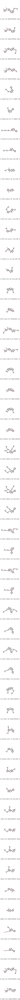

363/164: mollist=synscreen['molecules'].loc[synscreen['scaffold']=='Scaffold_07'].tolist()
363/165: len(mollist)
363/166:
MCSSmarts2=rdFMCS.FindMCS(mollist,atomCompare=rdFMCS.AtomCompare.CompareAny,bondCompare=rdFMCS.BondCompare.CompareOrderExact,ringMatchesRingOnly=False,timeout=1).smartsString
MCSSmarts=rdFMCS.FindMCS(mollist,atomCompare=rdFMCS.AtomCompare.CompareElements,bondCompare=rdFMCS.BondCompare.CompareOrder,ringMatchesRingOnly=False,timeout=1).smartsString
363/167:
m2=Chem.MolFromSmarts(MCSSmarts2)
m1=Chem.MolFromSmarts(MCSSmarts)
363/168: m2
363/169: m1
363/170:
patt = Chem.MolFromSmarts(MCSSmarts)
hit=0
for m in chembl_df['mols']:
    if m.HasSubstructMatch(patt):
        hit+=1
363/171: ((hit+1)/1870423)
363/172: mollist=synscreen['molecules'].loc[synscreen['scaffold']=='Scaffold_09'].tolist()
363/173: len(mollist)
363/174:
MCSSmarts2=rdFMCS.FindMCS(mollist,atomCompare=rdFMCS.AtomCompare.CompareAny,bondCompare=rdFMCS.BondCompare.CompareOrderExact,ringMatchesRingOnly=False,

392/192: test.shape
392/193: count
392/194: chem_id[765]
392/195:
test=[]
for i in set(chem_id):
              c.execute(f"select tid from target_dictionary where chembl_id=='{i}';")
              test.append(c.fetchall())
392/196: len(test)
392/197: len(set(test))
392/198: test[9]
392/199: test=np.array(test)
392/200: test = test.reshape((test.shape[0]*test.shape[1]), test.shape[2])
392/201: test.shape
392/202: test[567]
392/203:
tid=[]
for i in set(chem_id):
              c.execute(f"select tid from target_dictionary where chembl_id=='{i}';")
              test.append(c.fetchall())
392/204:
tid=[]
for i in set(chem_id):
              c.execute(f"select tid from target_dictionary where chembl_id=='{i}';")
              tid.append(c.fetchall())
392/205: tid=np.array(tid)
392/206: tid = tid.reshape((tid.shape[0]*tid.shape[1]), tid.shape[2])
392/207: tid[567]
392/208: len(tid)
392/209: len(set(tid))
392/210: len(set(list(tid)))
392/211:
count=0
for i in tid:
    if len(i)!=1:
        cou

403/78:
test=[]
for i in componenet_seq_table['accession']:
    count=0
    for j in uniprot_filter_data['uniport_id']:
        if i.upper()==j.upper():
            count+=1
    if count!=1:
        #print(i,count)
        test.append(componenet_seq_table.index[componenet_seq_table['accession']==i][0])
403/79: len(test)
403/80: uniprot_filter_data.loc[uniprot_filter_data['uniport_id']=='O75762']
403/81: componenet_seq_table.drop(test,inplace=True)
403/82: componenet_seq_table.shape
403/83: uniprot_filter_data.head()
403/84:
test=[]
for i in uniprot_filter_data.uniport_id:
    for j in componenet_seq_table.accession:
        if i==j:
            test.append(componenet_seq_table.loc[componenet_seq_table.index[componenet_seq_table['accession']==i][0]]['tax_id'])
403/85: uniprot_filter_data['tax_id']=test
403/86: uniprot_filter_data.head(2)
403/87: uniprot_filter_data.head(2)
403/88:
test=[]
for i in uniprot_filter_data.uniport_id:
    for j in componenet_seq_table.accession:
        if i=

430/13: len(common)
430/14:
common_id=[]
for i in common.keys():
      if common[i]>=3:
              common_id.append(i)
430/15: len(common_id)
430/16:
common_id=[]
for i in common.keys():
      if common[i]==4:
              common_id.append(i)
430/17: len(common_id)
430/18:
with open('common_id_in_more_than 2 tests.txt', 'w') as f:
    for item in common_id:
          f.write("%s\n" % item)
430/19: common_id=pd.DataFrame(common_id,columns=['Accession'])
430/20:
common_id=[]
for i in common.keys():
      if common[i]>=2:
              common_id.append(i)
430/21: len(common_id)
430/22: common_id=pd.DataFrame(common_id,columns=['Accession'])
430/23: common_id.to_excel('common_accession_ids for tests.xlsx')
430/24: common_id_sample=pd.read_excel('common_accession_ids.xlsx')
430/25: common_id_sample.shape
430/26: common_id.loc[~common_id['Accession'].isin(common_id_sample['Accession'])]
430/27: common_id.loc[~common_id['Accession'].isin(common_id_sample['Accession'])].to_excel('accession

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



529/578:
    part1=Chem.MolFromSmiles('*N(CC)[C@H]1CCN(Cc2ccccc2)C1')
    part2=Chem.MolFromSmiles('*C(=O)c1ccc2c(c1)[C@H](NS(=O)(=O)c1ccc(CC)cc1)[C@@H](O)C(C)(C)O2')
    part1_ha=part1.GetNumAtoms(onlyExplicit=True)
    part2_ha=part2.GetNumAtoms(onlyExplicit=True)
    mw1=Chem.Descriptors.MolWt(part1)
    mw2=CHem.Descriptors.MolWt(part2)
    if part1_ha/part2_ha<=0.33:
        print('yes')
    else:
        print('no')
529/579:
    part1=Chem.MolFromSmiles('*N(CC)[C@H]1CCN(Cc2ccccc2)C1')
    part2=Chem.MolFromSmiles('*C(=O)c1ccc2c(c1)[C@H](NS(=O)(=O)c1ccc(CC)cc1)[C@@H](O)C(C)(C)O2')
    part1_ha=part1.GetNumAtoms(onlyExplicit=True)
    part2_ha=part2.GetNumAtoms(onlyExplicit=True)
    mw1=Chem.Descriptors.MolWt(part1)
    mw2=Chem.Descriptors.MolWt(part2)
    if part1_ha/part2_ha<=0.33:
        print('yes')
    else:
        print('no')
529/580: mw1
529/581: mw1/mw2
529/582:
def proportion_condition(l):
    part1=Chem.MolFromSmiles(l[1])
    part2=Chem.MolFromSmiles(l[2])
    part1_

574/70: data.Plastic.values.count()
574/71: len(data.Plastic.values)
574/72: data.Plastic.value_counts()
574/73: data.Enzyme.value_counts()
574/74: data.Microorganism.value_counts()
574/75: type(data.Microorganism.value_counts())
574/76: data.Enzyme.value_counts()>3
574/77: data.Enzyme.value_counts()>3.count
574/78: data.Enzyme.value_counts()>3.count()
574/79: data.Enzyme.value_counts()>3.sum()
574/80: data.Enzyme.value_counts()>3.sum
574/81: data.Enzyme.value_counts()
574/82: data.Enzyme.value_counts()
574/83: data.Enzyme.value_counts()
574/84: data.Enzyme.value_counts()
574/85: data.Enzyme.values
574/86: data.Microorganism.values
574/87: species=data.Microorganism.values
574/88: import collections
574/89: collections.OrderedDict(species)
574/90: collections.Counter(species)
574/91: collections.defaultdict(species)
574/92: collections.Counter(species)
574/93: sort(collections.Counter(species))
574/94: collections.Counter(species)
574/95: collections.Counter(species).values()
574/96: c

616/16: sequence[1]
616/17: sequence=sequence[1:]
616/18: sequence[0]
616/19: multi_sequence=[seq for seq in sequence if seq.find(';')>=0]
616/20: len(multi_sequence)
616/21: multi_sequence[0]
616/22: multi_sequence[0].split(';')
616/23: multi_sequence[1].split(';')
616/24: multi_sequence[2].split(';')
616/25: multi_sequence[3].split(';')
616/26: multi_sequence[4].split(';')
616/27: multi_sequence[5].split(';')
616/28: multi_sequence[4].split(';')
616/29: multi_sequence_break=[seq.split(';')for seq in multi_sequence]
616/30: len(multi_sequence_break)
616/31: [len(i)for i in multi_sequence_break]
616/32: len(seq)
616/33: len(sequence)
616/34: multi_sequence_break1=[i for seq in multi_sequence_break for i in seq]
616/35: multi_sequence_break1
616/36: multi_sequence_break1[:2]
616/37: sequence-multi_sequence
616/38: set(sequence)-multi_sequence
616/39: set(sequence)-set(multi_sequence)
616/40: sequence=set(sequence)-set(multi_sequence)
616/41: len(sequence)
616/42: type(sequence)
616/43: 

631/257: len(table_all)
631/258: len(set(table_all))
631/259: len(table_all)
631/260: table_all-type_column
631/261: table_all_minus = [x for x in table_all if x not in type_column]
631/262: len(table_all_minus)
631/263:
for i in range(0,130,5):
    print(i)
631/264:
for i in range(0,130,5):
    content=table_all_minus[i]
    print(content.text)
631/265:
for i in range(0,130,5):
    content=table_all_minus[i]
    print(content.text.strip())
631/266: # Web scraping of table from below URL
631/267: aroPT_uniprot=pd.read_excel('uniprot-aromatic+prenyltransferase-filtered-reviewed yes.xlsx')
631/268: aroPT_uniprot.head()
631/269:
review_gene=[]
for i in range(0,130,5):
    content=table_all_minus[i]
    review_gene.append(content.text.strip())
631/270: aroPT_uniprot.head()
631/271:
for gene in review_gene:
    print(gene)
    print(gene.lower())
631/272:
for gene in review_gene:
    for gene_ in aroPT_uniprot['Gene names']:
        if gene.lower()==gene_.strip().lower():
            print(

686/72: ! head - domain.head()
686/73: domain.drop_duplicates(inplace=True)
686/74: domain.shape
686/75: domain.columns=['enzyme','donot1','length','hit_db','hit_db_id','hit_name','start','end','e value','donot2','date','interpro_hit','interpro_hit name','go anotaion','metacyc']
686/76: domain.head()
686/77: index = pd.MultiIndex.from_arrays(domain,names=['enzyme','donot1','length','hit_db','hit_db_id','hit_name','start','end','e value','donot2','date','interpro_hit','interpro_hit name','go anotaion','metacyc'))
686/78: index = pd.MultiIndex.from_arrays(domain,names=('enzyme','donot1','length','hit_db','hit_db_id','hit_name','start','end','e value','donot2','date','interpro_hit','interpro_hit name','go anotaion','metacyc'))
686/79: index = pd.MultiIndex.from_arrays(domain,names=('enzyme','hit_db'))
686/80: index = pd.MultiIndex.from_arrays(domain,names=('enzyme'))
686/81: pfamcollections.Counter(pfam_enz)
686/82: pfam=collections.Counter(pfam_enz)
686/83: pfam
686/84: pfam_enz
686/85: 

739/11: list(record_after_wait.values())[-100:]
739/12: list(record_after_wait.values())[-1000:]
739/13: list(record_after_wait.values())[-200:]
739/14: list(record_after_wait.values())[-300:]
739/15: list(record_after_wait.values())[-500:]
739/16: list(record_after_wait.values())[-600:]
739/17: list(record_after_wait.values())[-550:]
739/18: list(record_after_wait.values())[-570:]
739/19: list(record_after_wait.values())[-520:]
739/20: list(record_after_wait.values())[-570:]
739/21: list(record_after_wait.keys())[-570:]
739/22: driver=webdriver.Firefox()
739/23: record_after_wait['31727']
739/24: record_after_wait[31727]
739/25: record_after_wait.item()
739/26: record_after_wait.items()
739/27: record_after_wait['031727']
739/28: record_after_wait['031427']
739/29: record_after_wait['032206']
739/30:
for j in range(32208,50000):
    try:
            record_local=[]
            count=1000000+j
            count=str(count)
            count=count[1:]
            url=f'http://terokit.qmc

790/102: ! grep 'SARE4565' first_needleall
790/103: ! grep 'SARE4565' first_needleall | grep 'A1DN10'
790/104:
for i in range(17,2):
    print(targets[i],targets[i+1])
790/105:
for i in range(17,2):
    print(i)
790/106:
for i in range(0,17,2):
    print(i)
790/107:
for i in range(0,17,2):
    print(targets[i],targets[i+1])
790/108: targets.index('A8M6W6')
790/109:
for i in range(0,17,2):
    print(targets[repeat[i]],targets[repeat[i+1]])
790/110: ! grep 'SARE4565' first_needleall | grep 'A8M6W6'
790/111: ! grep 'SARE4565' first_needleall
790/112: ! grep 'A1CRX0' first_needleall
790/113: ! grep 'SARE4565' first_needleall | grep 'EAW08391'
790/114: targets[93]
790/115: targets[126]
790/116: ! grep 'A1CRX0' first_needleall | grep 'EAW08391'
790/117: ! grep 'A1CRX0 A1CRX0' first_needleall
790/118:
for i in range(0,17,2):
    p,q=targets[repeat[i]],targets[repeat[i+1]]
    print(! grep f'{p} {p}' first_needleall )
    print(! grep f'{p}' first_needleall | grep f'{q}')
790/119:
for i in ran

831/40: ! grep '>' cluster\ 5\ sequence.fasta | wc -l
831/41: ! grep '>' cluster\ 6\ sequence.fasta | wc -l
831/42:

for i in range(1,7,1):
      test=[]
      for record in SeqIO.parse(f'cluster {i} sequence.fasta', "fasta"):
            test.append(record.seq)
      print(len(test))
831/43: 1399*0.7
831/44:

for i in range(1,7,1):
      test=[]
      for record in SeqIO.parse(f'cluster {i} sequence.fasta', "fasta"):
            test.append(record.seq)
      count=0
      for i in range(2246):
        sample=[]
        for j in range(1399):
            sample.append(test[j][i])
        conser=collections.Counter(sample)
        if list(conser.keys())[0]!='-':
            if conser[list(conser.keys())[0]] > 979:
                amino=list(conser.keys())[0]
                #print(f'conservation at position {i} is {amino}')
                count+=1
      print(f'at {i} {count}')
831/45:

for i in range(1,7,1):
      test=[]
      for record in SeqIO.parse(f'cluster {i} sequence.fasta', "

879/416: hit
879/417: hit=ms_50[0].GetSubstructMatches(patt)
879/418: hit
879/419: ms_50[0]
879/420:
for j in range(1,6,1): 
        neighbor=[x.GetAtomicNum() for x in m.GetAtomWithIdx(hit[j]).GetNeighbors()]
        print(neighbor)
879/421:
for j in range(1,6,1): 
        neighbor=[x.GetAtomicNum() for x in ms_50[0].GetAtomWithIdx(hit[j]).GetNeighbors()]
        print(neighbor)
879/422: hit=ms_50[0].GetSubstructMatches(patt)
879/423:
for j in range(1,6,1): 
        neighbor=[x.GetAtomicNum() for x in ms_50[0].GetAtomWithIdx(hit[j]).GetNeighbors()]
        print(neighbor)
879/424: hit
879/425: hit=ms_50[0].GetSubstructMatch(patt)
879/426:
for j in range(1,6,1): 
        neighbor=[x.GetAtomicNum() for x in ms_50[0].GetAtomWithIdx(hit[j]).GetNeighbors()]
        print(neighbor)
879/427: hit
879/428: patt
879/429:
for j in range(1,5,1): 
        neighbor=[x.GetAtomicNum() for x in ms_50[0].GetAtomWithIdx(hit[j]).GetNeighbors()]
        print(neighbor)
879/430:
for j in range(0,5,1): 
   

879/702:
counter1=[]
for i in range(306):
    for j in range(1942815):
        if mat_reverse_smart[i][j]==1:
            counter1.append(j)
879/703: len(counter1)
879/704: len(list(set(counter1)))
879/705:
fps_reverse_morgan_parent_smart =[]
ms_reverse_preny_parent_smart=[]
for i in counter1:
    ms_reverse_preny_parent_smart.append(ms[i])
    fps_reverse_morgan_parent_smart.append(AllChem.GetMorganFingerprint(ms[i],3))
879/706:
fps_reverse_morgan_child_smart=[]
for i in reverse_patt_any2:
    ps = rxn.RunReactants((ms[i],))
    Chem.SanitizeMol(ps[0][0])
    fps_reverse_morgan_child_smart.append(AllChem.GetMorganFingerprint(ps[0][0],3))
879/707: len(fps_reverse_morgan_child_smart)
879/708: mat_reverse_morgan_smart=np.zeros([306,1942815])
879/709: parent_mol_index_smart=list(set(counter1))
879/710:
fps_reverse_morgan_parent_smart =[]
ms_reverse_preny_parent_smart=[]
for i in parent_mol_index_smart:
    ms_reverse_preny_parent_smart.append(ms[i])
    fps_reverse_morgan_parent_smart.app

906/295: sum(data_regular_activity['standard_units'].value_counts())
906/296: regular_molreg_pair=pd.read_csv('c10_parent_child_pair_molregno.txt',sep='\t',header=None)
906/297: regular_molreg_pair_df=pd.DataFrame(regular_molreg_pair )
906/298: regular_molreg_pair_df.columns=['parent_molregno','child_molregno']
906/299:
test=0
for index,row in regular_molreg_pair_df.iterrows():
    common=set(data_regular_activity.loc[data_regular_activity['molregno']==row['parent_molregno']]['assay_id']).intersection(set(data_regular_activity.loc[data_regular_activity['molregno']==row['child_molregno']]['assay_id']))
    if len(common)>0:
        #print(common)
        test+=1
906/300: test
906/301:
test=0
for index,row in regular_molreg_pair_df.iterrows():
    common=set(data_regular_activity.loc[data_regular_activity['molregno']==row['parent_molregno']]['assay_id']).intersection(set(data_regular_activity.loc[data_regular_activity['molregno']==row['child_molregno']]['assay_id']))
    if len(common)>0

906/1285: ms_50[0].HasSubstructMatch(patt10)
906/1286: patt10=Chem.MolFromSmarts('[#6;!R][#6]([#6;!R])[#6][#6][R,#8][*;R]')
906/1287: ms_50[0].HasSubstructMatch(patt10)
906/1288: patt10=Chem.MolFromSmarts('[#6;!R][#6]([#6&!R])[#6][#6][R,#8][*;R]')
906/1289: ms_50[0].HasSubstructMatch(patt10)
906/1290: ms_50[10]
906/1291: patt10=Chem.MolFromSmarts('[#6;!R][#6]([#6;!R])[#6][#6][R,#8][*;R]')
906/1292: ms_50[10].HasSubstructMatch(patt10)
906/1293: patt10=Chem.MolFromSmarts('[#6;!R][#6]([#6,!R])[#6][#6][R,#8][*;R]')
906/1294: ms_50[10].HasSubstructMatch(patt10)
906/1295: patt10=Chem.MolFromSmarts('[#6;!R][#6](-;[#6,!R])[#6][#6][R,#8][*;R]')
906/1296: patt10=Chem.MolFromSmarts('[#6;!R][#6](-,[#6,!R])[#6][#6][R,#8][*;R]')
906/1297: patt10=Chem.MolFromSmarts('[#6;!R][#6]([#6;!R])[#6][#6][R,#8][*;R]')
906/1298: patt10=Chem.MolFromSmarts('[*;R][R,#8][#6][#6][#6](-[#6])-[#6]')
906/1299:
patt10_index=[]
for i in range(2025646):
         if ms[i].HasSubstructMatch(patt10):
            patt10_index.

906/2389: m
906/2390: ms[combine_index[1]]
906/2391: ms[combine_index[0]]
906/2392: parent[0]
906/2393:

#m= ms[1385718]
parent=[]
for j in combine_index:
  present=True
  print(j)
  m= ms[j]  
  while present:
    status=False
    for i in range(19):
        if m.HasSubstructMatch(prenyl_patt[i]):  
           if i!=11 and i<15:
                 Chem.Kekulize(m)
                 ps = prenyl_rxn[i].RunReactants((m,))
                 #m=remove_patt(m,prenyl_rxn[i],True)
                 Chem.SanitizeMol(ps[0][0])
                 m=ps[0][0]   
                 status=True
                 print(i)   
           else:
                 ps = prenyl_rxn[i].RunReactants((m,))
                 #m=remove_patt(m,prenyl_rxn[i],False)
                 m=ps[0][1]   
                 status=True
    if not status:
        parent.append(m)
        present=False
906/2394: ms[1736714]
906/2395:

#m= ms[1385718]
parent=[]
for j in combine_index:
  present=True
  print(j)
  m= ms[j]  
  while present:


917/201: mat_patt_df[:,1]
917/202: mat_patt_df[1,axis=1)]
917/203: mat_patt_df[1,axis=1]
917/204: mat_patt_df.loc[1,axis=1]
917/205: mat_patt_df.iloc[:,1]
917/206: mat_patt_df.iloc[mat_patt_df[:,0]==1.0]
917/207: mat_patt_df.iloc[mat_patt_df[:,1]==1.0]
917/208: mat_patt_df.iloc[:,1:2]
917/209: mat_patt_df.iloc[:,1:2]==1.0
917/210: mat_patt_df.loc[mat_patt_df.iloc[:,1:2]==1.0]
917/211: [mat_patt_df.iloc[:,1:2]==1.0][0]
917/212: [mat_patt_df.iloc[:,1:2]==1.0][1]
917/213: [mat_patt_df.iloc[:,1:2]==1.0][0]
917/214: list(mat_patt_df.iloc[:,1:2]==1.0)
917/215:
for i in range(19):
    print(f'col{i}')
917/216:
for i in range(19):
    print(f'col{i},')
917/217:
for i in range(19):
    print(f'"col{i}",')
917/218:
for i in range(19):
    print(f"'col{i}',")
917/219:
['col0',
'col1',
'col2',
'col3',
'col4',
'col5',
'col6',
'col7',
'col8',
'col9',
'col10',
'col11',
'col12',
'col13',
'col14',
'col15',
'col16',
'col17',
'col18']
917/220:
col=['col0',
'col1',
'col2',
'col3',
'col4',
'col5',
'col6',


923/675: ms_20[1]
923/676: Chem.MolToSmiles(ps[0][0])
923/677: Chem.MolToSmiles(ms_20[0])
923/678:  fps1=AllChem.GetMorganFingerprint(Chem.MolFromSmiles(Chem.MolToSmiles(ps[0][0])),3)
923/679:  fps2=AllChem.GetMorganFingerprint(ms_20[0],3)
923/680: DataStructs.TanimotoSimilarity(fps1,fps2)
923/681:  fps1=AllChem.GetMorganFingerprint(Chem.MolFromSmiles(Chem.MolToSmiles(ps[0][0])),2)
923/682:  fps2=AllChem.GetMorganFingerprint(ms_20[0],2)
923/683: DataStructs.TanimotoSimilarity(fps1,fps2)
923/684: ms_20[0]
923/685: Chem.MolToSmiles(ps[0][0])==Chem.MolToSmiles(ms_20[0])
923/686:
count_select=[]
for i in count:
    s=i.split('\t')
    if ms_prenyl_all[int(s[0])].HasSubstructMatch(prenyl_patt[4]):
        ps = patt_cycle16_rxn.RunReactants(( ms_prenyl_all[int(s[1])],))
        Chem.SanitizeMol(ps[0][0])
        if Chem.MolToSmiles(ps[0][0])==Chem.MolToSmiles(ms_prenyl_all[int(s[0])]):
            count_select.append(i)
    else:
        ps = patt_cycle16_rxn.RunReactants((ms_prenyl_all[int(

946/6:
scope_plot=rs(settings, radial_scope_setup_R1,radial_scope_setup_R2) # add all radial_scope dictionaries to this call
SVG('substrate_scope_replaced.svg')
946/7:
radial_scope_setup_R1= {
    'rest_label':"R$_1$", # Label of the atom in the radial scope plot
    'no_wedges':2, # Number of wedges in the Radial scope Plot
    'coverangle_wedges':60, # Degrees of a full circle the Rscope should cover
    'startangle':120, #Start angle of the Rscope 
    'CMAPINNER':"Blues",  # Colormap of the inner circle. Max value has full color, options see below
    'CMAPOUTER':"Greens", # Colormap of the outer circle. Max value has full color
    'OUTERLABEL':"AbcD % conversion", # Label of the outer circle
    'INNERLABEL':"CtfY % conversion", # Label of the inner circle
    'value_inner_circle':[ 1,99],
    'value_outer_circle':[ 1,99],
    'min_max_value':[(0,0),(100,100)],  # Define minimum and maximum for each colorbar [(inner_min, outer_min),(inner_max, outer_max)]
    'rounding':True, # E

955/306: collections.Counter(test1)
955/307: c10_whole_ring_regular
955/308:
test1=[]
for i in range(2519):
    m=ms[test[i]]
    #hem.SanitizeMol(compound1)
    match=m.GetSubstructMatches(c10_whole_ring_regular)
    test1.append(len(match))
    print(match)
    status=False
    for j in match:
        for k in j:
            print(k)
            print(m.GetAtomWithIdx(k).GetSymbol())
            print([neigh.GetSymbol() for neigh in m.GetAtomWithIdx(k).GetNeighbors()])
    break
955/309: len(match[0])
955/310: len(match[1])
955/311: c10_whole_ring_regular
955/312:
test1=[]
for i in range(2519):
    m=ms[test[i]]
    #hem.SanitizeMol(compound1)
    match=m.GetSubstructMatches(c10_whole_ring_regular)
    test1.append(len(match))
    print(match)
    status=False
    for j in match:
        for k in j:
            print(j.index(k))
            print(m.GetAtomWithIdx(k).GetSymbol())
            print([neigh.GetSymbol() for neigh in m.GetAtomWithIdx(k).GetNeighbors()])
    break
955/313:


974/71:
scaffold=[
scaffold1,
scaffold2,
scaffold3,
scaffold4,
scaffold5,
scaffold6,
scaffold7]
974/72: count=count1+count2+count3+count4+count5+count6+count7
974/73: len(count)
974/74: len(set(count))
974/75:

for i in range(11970):
    m=ms[count1[i]]
    match=m.GetSubstructMatches(scaffold1)
    status=True
    match_hit=[]
    for j in match:
        for k in j:
            #if not m.GetAtomWithIdx(k).IsInRing():
                for atom_neighbor in m.GetAtomWithIdx(k).GetNeighbors():
                    if atom_neighbor.GetIdx() not in j:
                        if atom_neighbor.GetSymbol()!='O':
                            status=False
                            break
        if not status:
           match_hit.append(0)
           status=True
        else:
           match_hit.append(1) 
            
    if sum(match_hit)>0:
        test1.append(count1[i])
974/76:

for i in range(11970):
    m=ms[count1[i]]
    match=m.GetSubstructMatches(scaffold1)
    status=True
    match_h

997/269:
count20=[]
test=0
for i in range(406747):
    m=ms[i]
    #Chem.SanitizeMol(m)
    try:
        if m.HasSubstructMatch(scaffold20):
            count20.append(i)
    except:
        test+=1
997/270: len(count20)
997/271: test20=[]
997/272:
for i in range(20):
    m=ms[count20[i]]
    match=m.GetSubstructMatches(scaffold20)
    status=True
    match_hit=[]
    for j in match:
        for k in j:
            #if not m.GetAtomWithIdx(k).IsInRing():
                for atom_neighbor in m.GetAtomWithIdx(k).GetNeighbors():
                    if atom_neighbor.GetIdx() not in j:
                        if  not (atom_neighbor.GetSymbol()=='N' or atom_neighbor.GetSymbol()=='O'):
                            status=False
                            break
        if not status:
           match_hit.append(0)
           status=True
        else:
           match_hit.append(1) 
            
    if sum(match_hit)>0:
        test20.append(count20[i])
997/273: test20=[]
997/274:
for i in range

1037/55:
for i in range(7):
    for j in range(7):
        ones[i][j]=len(set(frames[i]['cocunet_id'].unique()).intersection(set(frames[j]['cocunet_id'].unique()))))
1037/56:
for i in range(7):
    for j in range(7):
        ones[i][j]=len(set(frames[i]['cocunet_id'].unique()).intersection(set(frames[j]['cocunet_id'].unique())))
1037/57: ones=np.zeros([7,7])
1037/58:
for i in range(7):
    for j in range(7):
        ones[i][j]=len(set(frames[i]['cocunet_id'].unique()).intersection(set(frames[j]['cocunet_id'].unique())))
1037/59: ones
1037/60: ones[i,:]/ones[i,i]
1037/61: [ones[i,:]/ones[i,i] for i in range(7)]
1037/62: [ones[i,:]=ones[i,:]/ones[i,i] for i in range(7)]
1037/63: [ones[i,:]/ones[i,i] for i in range(7)]
1037/64: zero=[ones[i,:]/ones[i,i] for i in range(7)]
1037/65:
for i in range(7):
    ones[i,:]=zero[i]
1037/66:
import seaborn as sns
import matplotlib as plt
1037/67:
with sns.axes_style("white"):
    f, ax = plt.pyplot.subplots(figsize=(10, 10))
    ax = sns.heatmap(ones

1049/305: genus_matrix[0,:]
1049/306: [genus_matrix[0,:] for i in range(genus_matrix.shape[0])]
1049/307: [sum(genus_matrix[0,:]) for i in range(genus_matrix.shape[0])]
1049/308: [sum(genus_matrix[i,:]) for i in range(genus_matrix.shape[0])]
1049/309: [sum(genus_matrix[i,:]) for i in range(genus_matrix.shape[0])]>3
1049/310: sum([j>3 for j in [sum(genus_matrix[i,:]) for i in range(genus_matrix.shape[0])]])
1049/311: genus_matrix.shape
1049/312: sum([j>19 for j in [sum(genus_matrix[:,i]) for i in range(genus_matrix.shape[1])]])
1049/313: sum([j>15 for j in [sum(genus_matrix[:,i]) for i in range(genus_matrix.shape[1])]])
1049/314: sum([j>10 for j in [sum(genus_matrix[:,i]) for i in range(genus_matrix.shape[1])]])
1049/315: sum([j>15 for j in [sum(genus_matrix[:,i]) for i in range(genus_matrix.shape[1])]])
1049/316: plastic_type[[j>15 for j in [sum(genus_matrix[:,i]) for i in range(genus_matrix.shape[1])]]]
1049/317: len([j>15 for j in [sum(genus_matrix[:,i]) for i in range(genus_matrix.s

1061/86: mat1[32][:]
1061/87: mat1[32][:]
1061/88: mat1[31][:]
1061/89: mat1=np.array(data, dtype=str)
1061/90: np.nan([3,6])
1061/91: np.empty_like([95,15],dtype=str)
1061/92: np.empty_like(mat,dtype=str)
1061/93: np.empty(mat,dtype=str)
1061/94: np.empty_like(mat)
1061/95: data.shape
1061/96: np.zeros([95,15])
1061/97: np.zeros([95,15])[32,:]
1061/98: np.zeros([95,15])[32,:]=data.iloc[0].values
1061/99: np.zeros([95,15],dtype=str)[32,:]=data.iloc[0].values
1061/100: mat1=np.zeros([95,15],dtype=str)[32,:]=data.iloc[0].values
1061/101: mat1[32,:]
1061/102: mat1[32][:]
1061/103: data.index=data['microorganism']
1061/104: data.head()
1061/105: data.reindex(species_order2)
1061/106: from ete3 import ClusterTree
1061/107: mat1=np.array(data,dtype=str)
1061/108: t = ClusterTree('phylogenetic_95.txt', text_array=mat1)
1061/109: t = ClusterTree('phylogenetic_95.txt', text_array=mat1)
1061/110: mat1
1061/111: mat1.shape
1056/1: ls
1056/2: more example_mat.csv
1061/112: more mat1
1061/113: mat1

1081/68: combine_data['test3 area']=test3_area
1081/69: test4_area=np.zeros(122)
1081/70:
for _,row in test4.iterrows():
    test4_area[combine_metabolite.index(row['Name'])]=row['Area']
1081/71: combine_data['test4 area']=test4_area
1081/72: combine_data.to_excel('combine_data.xlsx',index=False)
1080/106: data_msystem=pd.read_excel('./../msystems_added_taxaid.xlsx')
1080/107: cd ..
1080/108: data_msystem=pd.read_excel('./../msystems_added_taxaid.xlsx')
1080/109: data_msystem.head(2)
1080/110: unique_enzymes=data_msystem.Sequence.unique()
1080/111: unique_enzymes=unique_enzymes[1:]
1080/112: enzyme_length=[len(i) for i in unique_enzymes]
1080/113: sns.histplot(enzyme_length)
1080/114: enzyme_df=data_msystem.loc[~(data_msystem['Sequence'].isnull())]
1080/115: enzyme_df.shape
1080/116:
from Bio import SeqIO
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
1080/117:
records=[]
for index,row in enzyme_df.iterrows():
    record=SeqRecord(Seq(row['Sequence']),
    id=f"{row['Tax I

1101/126: mat=np.zeros((24,24))
1101/127: mat.shape
1101/128: df.Plastic.unique
1101/129: df.Plastic.unique()
1101/130: plastic_selected=df.Plastic.unique()
1101/131: plastic_selected=list(df.Plastic.unique())
1101/132: len(plastic_selected)
1101/133: df.columns
1101/134: df.groupby(['Uniprot id'])
1101/135: gb=df.groupby(['Uniprot id'])
1101/136: gb.get_group()
1101/137: gb.get_group
1101/138: [i for i in gb.get_group]
1101/139: [i for i in gb.get_group()]
1101/140: gb['Plastic']
1101/141: gb['Plastic'].count()
1101/142: gk.index[0]
1101/143: gb.index[0]
1101/144:
for uniport,plastic in gb:
    print(uniport)
1101/145:
for uniport,plastic in gb:
    print(plastic)
1101/146:
for index in gb:
    print(index)
1101/147:
for index,plastic in gb:
    print(plastic)
1101/148:
for index,plastic in gb:
    print(plastic['Plastic'])
1101/149:
for index,plastic in gb:
    print(index)
    print(plastic['Plastic'])
1101/150:
for index,plastic in gb:
    print(index)
    for i in plastic['Plastic

1125/17: ### get family ids
1125/18:
count=[]
for taxa in df_org['taxa']:
    #print(taxa)
    genus=[]
    try:
        for key,value in ncbi.get_rank(ncbi.get_lineage(taxa)).items():
            if value=='family':
                genus.append(key)
    except:
        print(taxa)
    genus.append(taxa)
    count.append(genus)
1125/19: count[:10]
1125/20: count[:5]
1125/21: df_org=df_org.loc[~(df_org['taxa']=='-')]
1125/22: df_org.shape
1125/23: df_org.loc[~(df['Microorganism_abb']=='Uncultured bacterium')]
1125/24: df_org=df_org.loc[~(df['Microorganism_abb']=='Uncultured bacterium')]
1125/25: df_org.shape
1125/26: df_org=df_org.loc[~(df['Microorganism_abb']=='uncultured fungus')]
1125/27: df_org.shape
1125/28: df_org=df_org.loc[~(df['Microorganism_abb']=='Gut Microbiome')]
1125/29: df_org.shape
1125/30:
count=[]
for taxa in df_org['taxa']:
    #print(taxa)
    genus=[]
    for key,value in ncbi.get_rank(ncbi.get_lineage(taxa)).items():
        if value=='genus':
            genus.app

1155/16: df_org=df_org.loc[~(df['Microorganism_abb']=='uncultured fungus')]
1155/17: df_org=df_org.loc[~(df['Microorganism_abb']=='Gut Microbiome')]
1155/18: df_org.shape
1155/19:
count=[]
for taxa in df_org['taxa']:
    #print(taxa)
    kingdom=[]
    try:
        for key,value in ncbi.get_rank(ncbi.get_lineage(taxa)).items():
            if value=='superkingdom':
                kingdom.append(key)
    except:
        print(taxa)
    kingdom.append(taxa)
    count.append(kingdom)
1155/20: set([i[0] for i in count])
1155/21: bac_taxa=list(set([i[1] for i in count if i[0]==2]))
1155/22: df_org_bac=df_org.loc[df_org['taxa'].isin(bac_taxa)]
1155/23: df_org_bac.shape
1155/24:
bcount=[]
btaxa=[]
for taxa in df_org_bac['taxa']:
    #print(taxa)
    genus=[]
    try:
        for key,value in ncbi.get_rank(ncbi.get_lineage(taxa)).items():
            if value=='genus':
                genus.append(key)
                btaxa.append(taxa)
    except:
        print(taxa)
    genus.append(taxa)
 

In [243]:
%history -g

In [ ]:
fig = px.scatter(test,x='Dimension-1',y='Dimension-2',symbol='symb',color='colr',text=test['plastic'],symbol_sequence=symbols,
                 color_discrete_sequence = color)
fig.update_traces(textposition='bottom center',textfont_size=14,)
#img_bytes = fig.to_image(format="jpg")
#Image(img_bytes)
pio.write_image(fig, "microbial_mds.png")
#fig.to_image(format="png", engine="kaleido")
#fig.to_image(format="png")